## Affine registration & Warping CF & WF image patches

In [1]:
import os
import gc

import cv2
import h5py
import tifffile
import numpy as np
import pandas as pd

from skimage.transform import rescale


In [9]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
from IPython.display import display

rcParams.update({'font.size': 10})
rcParams.update({'figure.dpi': 300})

import warnings
warnings.filterwarnings('ignore')

### Load data

In [2]:
# Helper functions

### load in the xml file to see which files go in which spot
### create dataframe with file name and the corresponding row and col
def xml_file(image_key, SAMPLE):
    filestring = SAMPLE + image_key + '.xml'
    xml_data = open(filestring, 'r').read()  # Read file
    data = xml_data.split('\n\t\t')
    data_sub = []
    for string in data:
        if 'ims' in string: 
            data_sub.append(string)

    df = pd.DataFrame(columns = ['COL','ROW','FILE','ABS_H','ABS_V'])
    for a in data_sub: 
        if 'COL' not in a: 
            continue
        b = a.split('COL="')[1]
        c = b.split('"')[0]
        col = int(c)

        b = a.split('ROW="')[1]
        c = b.split('"')[0]
        row = int(c)

        b = a.split('IMG_REGEX="')[1]
        c = b.split('"')[0]
        file = c

        b = a.split('ABS_H="')[1]
        c = b.split('"')[0]
        abs_h = int(c)

        b = a.split('ABS_V="')[1]
        c = b.split('"')[0]
        abs_v = int(c)

        df.loc[len(df.index)] = [col,row,file,abs_h,abs_v]
    
    return df

    
def load_ims(filename, channel='Channel 0'):
    ims = h5py.File(filename, 'r')
    x = ims['DataSet']['ResolutionLevel 0']['TimePoint 0'][channel]['Data'][:][0]
    ims.close()
    return x


def load_tiles(
    meta_df, 
    sample_id,
    channel='Channel 0'
):
    """
    Load image tiles from metadata dataframe
    """
    
    # Compute height & width for each IMS tile
    ncol = meta_df['COL'].max()
    nrow = meta_df['ROW'].max()
    w = ((meta_df['ABS_H'].max() - meta_df['ABS_H'].min()) / ncol).astype(np.int32)
    h = ((meta_df['ABS_V'].max() - meta_df['ABS_V'].min()) / nrow).astype(np.int32) 

    tiled = np.zeros((h*(nrow+1), w*(ncol+1)))  # tiled image
    for i in range(meta_df.shape[0]):
        # Coordinate order: right to left, bottom to top
        dY, dX = tiled.shape[0] - meta_df.iloc[i]['ABS_V'] - h, tiled.shape[1] - meta_df.iloc[i]['ABS_H'] - w
        fname = meta_df.iloc[i]['FILE']
        curr_tile = load_ims(os.path.join(sample_id, fname))[:h, :w]        
        tiled[dY:dY+h, dX:dX+w] = curr_tile


    return tiled


def normalize(img, q0, q1):
    """Normalize image with quantile transformation"""
    assert 0 <= q0 < q1 <= 1, "Invalid rescale range"
    vmin, vmax = np.quantile(img, [q0, q1])
    img_scaled = img.copy()
    img_scaled[img_scaled < vmin] = vmin
    img_scaled[img_scaled > vmax] = vmax
    return (img_scaled - img_scaled.min()) / (img_scaled.max() - img_scaled.min())  # Convert to [0, 1]



In [3]:
data_path = '../../DLI/data/'
sample_id = os.path.join(data_path, '20230412_SampleS20/')

In [4]:
cycle_df = pd.read_csv('../../DLI/data/fileguide_S20.csv', index_col=[0])
cycle_df.head()

,CF,WF (750)
Cycle 1,Cycle_2023-04-12,Cycle_2023-04-12_1
Cylce 2,Cycle_2023-04-12_2,Cycle_2023-04-12_3
Cycle 3,Cycle_2023-04-12_4,Cycle_2023-04-12_5
Cycle 4,Cycle_2023-04-12_6,Cycle_2023-04-12_7
Cycle 5,Cycle_2023-04-12_8,Cycle_2023-04-12_9


Iterate throughout all cycles & channels per cycle:

In [5]:
src_key = 'Cycle_2023-04-12_1' # WF
dst_key = 'Cycle_2023-04-12' # CF
src_df = xml_file(image_key=src_key, SAMPLE=sample_id)
dst_df = xml_file(image_key=dst_key, SAMPLE=sample_id)

display(src_df.head())
display(dst_df.head())

,COL,ROW,FILE,ABS_H,ABS_V
0,0,0,Cycle_2023-04-12_1_F120.ims,0,0
1,1,0,Cycle_2023-04-12_1_F119.ims,1842,0
2,2,0,Cycle_2023-04-12_1_F096.ims,3684,0
3,3,0,Cycle_2023-04-12_1_F095.ims,5526,0
4,4,0,Cycle_2023-04-12_1_F072.ims,7368,0


,COL,ROW,FILE,ABS_H,ABS_V
0,0,0,Cycle_2023-04-12_F130.ims,0,0
1,1,0,Cycle_2023-04-12_F129.ims,1842,0
2,2,0,Cycle_2023-04-12_F104.ims,3684,0
3,3,0,Cycle_2023-04-12_F103.ims,5526,0
4,4,0,Cycle_2023-04-12_F078.ims,7368,0


In [6]:
scale = 0.25

src_img = load_tiles(src_df, sample_id)
src_img = rescale(src_img, scale=scale, preserve_range=True)
src_img = normalize(src_img, 0.05, 0.95)

dst_img  = load_tiles(dst_df, sample_id)
dst_img = rescale(dst_img, scale=scale, preserve_range=True)
dst_img = normalize(dst_img, 0.05, 0.95)

print(src_img.shape, dst_img.shape)

(5526, 5066) (5986, 5066)


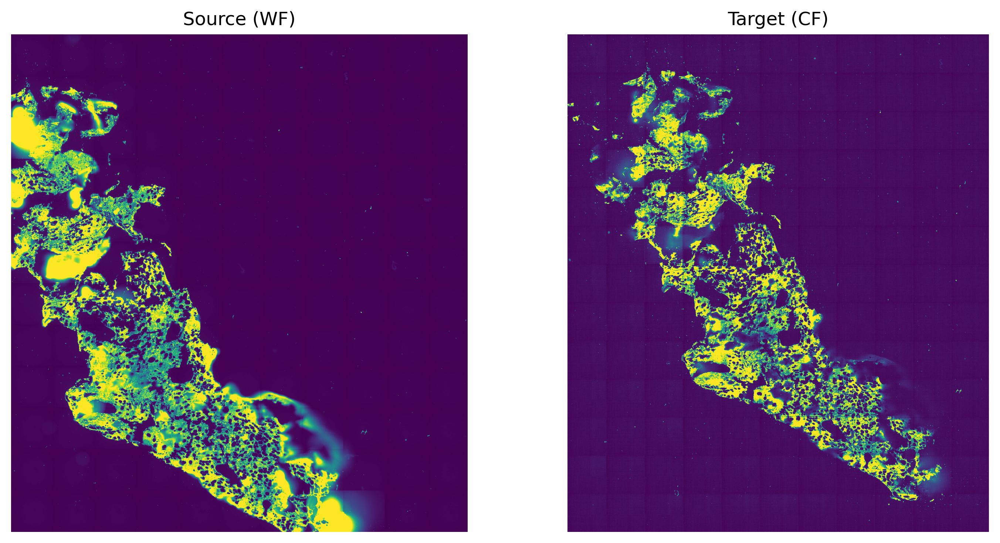

In [10]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(src_img)
ax1.axis('off')
ax1.set_title('Source (WF)')

ax2.imshow(dst_img)
ax2.axis('off')
ax2.set_title('Target (CF)')

plt.tight_layout()
plt.show()

### Compute Affine transform matrix & Warping

In [11]:
def compute_homography(
    src: np.ndarray,
    dst: np.ndarray,
) -> np.ndarray:
    """
    Compute 3x3 Homography matrix for rigid transformation
    """
    img_src = src.copy()
    img_dst = dst.copy()

    if img_src.max() <= 1:
        img_src = (img_src*255).astype(np.uint8)
    if img_dst.max() <= 1:
        img_dst = (img_dst*255).astype(np.uint8)

    # img_src = gaussian_blur(img_src, sigma=5)
    # img_dst = gaussian_blur(img_dst, sigma=5)

    sift = cv2.SIFT_create()
    pts_src, des_src = sift.detectAndCompute(img_src, None)
    pts_dst, des_dst = sift.detectAndCompute(img_dst, None)

    matcher = cv2.BFMatcher()
    matches = matcher.knnMatch(des_src, des_dst, k=2)

    good_matches = []
    for m, n in matches:
        if m.distance < 0.75*n.distance:
            good_matches.append(m)

    pts1, pts2 = [], []
    for m in good_matches:
        pt1, pt2 = pts_src[m.queryIdx].pt, pts_dst[m.trainIdx].pt
        if pt1 not in pts1 and pt2 not in pts2:
            pts1.append(pt1)
            pts2.append(pt2)
    pts1 = np.float32(pts1).reshape(-1, 1, 2)
    pts2 = np.float32(pts2).reshape(-1, 1, 2)

    H, _ = cv2.findHomography(pts1, pts2)

    return H

def warp_homography(
    img_src: np.ndarray,
    dst_shape: tuple[int, int],
    H: np.ndarray
):
    if img_src.max == 255:
        return cv2.warpPerspective(img_src, H, (dst_shape[1], dst_shape[0]))
    else:
        return cv2.warpPerspective((img_src*255).astype(np.uint8), H, (dst_shape[1], dst_shape[0]))

    

In [12]:
H = compute_homography(src_img, dst_img)
src_warped = warp_homography(src_img, dst_img.shape, H).astype(np.float32)
src_warped = (src_warped - src_warped.min()) / (src_warped.max() - src_warped.min())

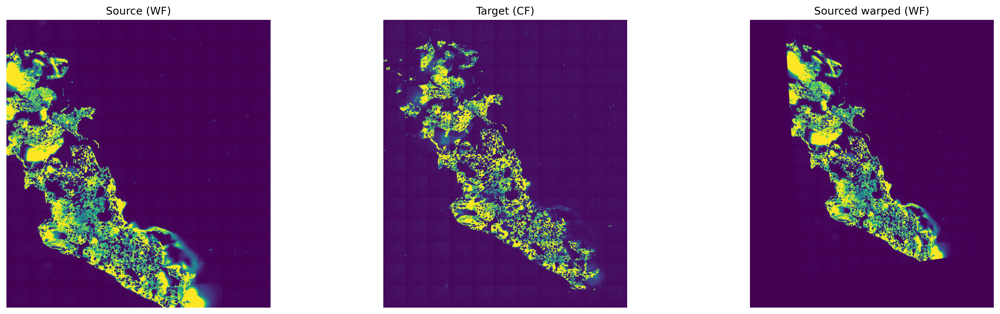

In [16]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
ax1.imshow(src_img)
ax1.axis('off')
ax1.set_title('Source (WF)')

ax2.imshow(dst_img)
ax2.axis('off')
ax2.set_title('Target (CF)')

ax3.imshow(src_warped)
ax3.axis('off')
ax3.set_title('Sourced warped (WF)')

plt.tight_layout()
plt.show()

In [18]:
scale = 4  # Resize back to original resolution
src_warped_fullres = rescale(src_warped, scale=scale, preserve_range=True)
dst_img_fullres = rescale(dst_img, scale=scale, preserve_range=True)
print(src_warped_fullres.shape)

(23944, 20264)


Save warped tiles:

In [ ]:
tile_size = 1842
nrows = int(np.round(src_warped_fullres.shape[0]/tile_size))
ncols = int(np.round(src_warped_fullres.shape[1]/tile_size))

res_path = os.path.join(data_path, 'res/registered_slides')
if not os.path.exists(res_path):
    os.makedirs(res_path, exist_ok=True)

for i in range(nrows):
    for j in range(ncols):
        idx0 = str(i) if i >= 10 else '0'+str(i)
        idx1 = str(j) if j >= 10 else '0'+str(j)
        if i % 5 == 0 and j % 5 == 0:
            print('Saving CF & WF tile_{0}_{1}...'.format(idx0, idx1))

        # Source (WF) tile
        tifffile.imwrite(
            os.path.join(res_path, 'WF_tile_{0}_{1}.tif'.format(idx0, idx1)), 
            src_warped_fullres[tile_size*i:tile_size*(i+1), tile_size*j:tile_size*(j+1)]
        )


        # Target (CF) tile
        tifffile.imwrite(
            os.path.join(res_path, 'CF_tile_{0}_{1}.tif'.format(idx0, idx1)), 
            dst_img_fullres[tile_size*i:tile_size*(i+1), tile_size*j:tile_size*(j+1)]
        )

---